# Structure
- Contains Attention Maps for a total of 25 steps, with 70 layers each
- Stored in a list format as (layer_name, attn_map)
- 25 * 70 = 1750 Attention Maps

In [1]:
import os
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
os.environ['CUDA_VISIBLE_DEVICES'] = '2,3'
import torch
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image

In [2]:
# scene='corgi'
# folder_path = f"./output/ditl2"
# filename_img = f'{scene}_15step.png' # Output Iamge
# attention_map_file_name = f'ditl2_{scene}_15step_attn_weight_full.pt'
# save_path = os.path.join(folder_path, f'{scene}_analysis')
# os.makedirs(save_path, exist_ok=True)

# img_path = os.path.join(folder_path, filename_img) # Output Image Path

scene='sample'
folder_path = f"./"
filename_img = f"sample.png"
attention_map_file_name = f'attn_maps.pt'
save_path = os.path.join(folder_path, f'analysis')
os.makedirs(save_path, exist_ok=True)

img_path = os.path.join(folder_path, filename_img) # Output Image Path

num_encoder_hidden_states = 264
num_register_token = 8

In [3]:
attention_map = torch.load(
    os.path.join(folder_path, attention_map_file_name))

num_steps = 250
num_layers = len(attention_map) // num_steps

print(len(attention_map))
print(f"num_layers: {num_layers}")

/tmp/ipykernel_223887/3446490909.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  attention_map = torch.load(


6000
num_layers: 24


In [ ]:
# Encoder 부분 제거
for i, map in enumerate(attention_map):
    if map[1].shape[0] != 4096:
        attention_map[i] = (map[0], map[1][num_encoder_hidden_states:, :])

In [ ]:
s = set()
for i, (name, map) in enumerate(attention_map):
    s.add(map.shape)
s

- The Attention Maps have two sizes: (1024, 1024) and (4096, 4096).

# Check Layers
    

In [ ]:
for i in range(num_layers):
    print(f"{i}: {attention_map[i][0]} | {attention_map[i][1].shape}")

# Analysis by Layer / Timestep
- Horizontal axis: Timestep
- Vertical axis: Layer

In [ ]:
from PIL import Image
import os
import multiprocessing

num_encoder_hidden_states = 264
num_register_token = 8
visualize_encoder_hidden_states = False


def plot_att_map():
    axes[i, time + 1].imshow(att_map, cmap='viridis')
    axes[i, time + 1].axis('off')
    
    axes[i, time + 1].set_title(f"Time : {time} \n Layer {i} : {name}")

    # Set color bar
    cbar = fig.colorbar(axes[i, time + 1].imshow(att_map, cmap='viridis'), ax=axes[i, time + 1])
    cbar.ax.set_ylabel('Attention Weight')
    return axes[i, time + 1]

# 원본 이미지 로드
img = Image.open(os.path.join(folder_path, filename_img))
img = np.array(img) / 255

# 전체 피규어 초기화
vis_step = 1
# num_rows = 2
num_rows = num_layers // vis_step
num_cols = num_steps + 1
fig, axes = plt.subplots(
    num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))


# 랜덤하게 픽셀 선택 (원본 이미지 기준)
max_h = int(img.shape[0])
max_y = int(img.shape[1])
original_img_h = torch.randint(int(max_h * 0.25), int(max_h * 0.75), (1,)).item()
original_img_w = torch.randint(int(max_y * 0.25), int(max_y * 0.75), (1,)).item()

original_img_h = 800
original_img_w = 500

print(f"original_img_h: {original_img_h}, original_img_w: {original_img_w}")

img_ = img.copy()
# 원본 이미지 넘파이 어레이에서 random_x, random_y 위치의 픽셀을 빨갛게 표시
percent_h = original_img_h / max_h
percent_w = original_img_w / max_y

# 빨갛게 칠할 범위 설정
red_box_size = 20
start_h = max(0, original_img_h - red_box_size // 2)
end_h = min(max_h, original_img_h + red_box_size // 2 + 1)
start_w = max(0, original_img_w - red_box_size // 2)
end_w = min(max_y, original_img_w + red_box_size // 2 + 1)

# 빨갛게 칠하기
img_[start_h:end_h, start_w:end_w, 0] = 1  # Red channel
img_[start_h:end_h, start_w:end_w, 1] = 0  # Green channel
img_[start_h:end_h, start_w:end_w, 2] = 0  # Blue channel

# 격자선
img_[original_img_h, :] = [1, 0, 0]
img_[:, original_img_w] = [1, 0, 0]

axes[0, 0].imshow(img_)
axes[0, 0].axis('off')
axes[0, 0].set_title(f'Original Image\n (H,W) Coord : {original_img_h}, {original_img_w}')

# 하나의 Row에 대해 25개의 Time Step을 표시
# for i, layer_num in enumerate(range(14, 15, vis_step)):
for i, layer_num in enumerate(range(0, num_layers, vis_step)):
    for time in range(num_steps):
        
        idx = num_layers * time + layer_num # Layer Index, Attention Map 기준 (1D)
        
        name, layer_weight = attention_map[idx] # (4360, 4360)
        
        register_token = layer_weight[:, :num_register_token]  # (4360, 8)
        encoder_hidden_states = layer_weight[:, num_register_token:num_encoder_hidden_states] # (4360, 256)
        layer_weight = layer_weight[:, num_encoder_hidden_states:]  # (4360, 4096)
        
        max_h = int(np.sqrt(layer_weight.shape[0]))
        max_w = int(np.sqrt(layer_weight.shape[1]))
        
        # Attention Map에서의 픽셀 인덱스
        h = round(max_h * percent_h)
        w = round(max_w * percent_w)
        pix_idx = int(h * np.sqrt(layer_weight.shape[0]) + w)
        
        # To visualize encoder_hidden_states
        if visualize_encoder_hidden_states:
            encoder_hidden_states_h = (num_encoder_hidden_states - num_register_token) // max_w
            att_map = np.zeros((max_h + 5, max_w))
            att_map[encoder_hidden_states_h + 1:,
                    :] = layer_weight[pix_idx].reshape(max_h, max_w).astype(np.float32)
            att_map[0, :num_register_token] = register_token[pix_idx]
            # print(f"register_token weights: {np.sum(register_token[pix_idx])}")
            att_map[1:encoder_hidden_states_h + 1, :max_w] = encoder_hidden_states[pix_idx].reshape(encoder_hidden_states_h, max_w)
        else :
            att_map = layer_weight[pix_idx].reshape(max_h, max_w).astype(np.float32)
        
        # p = multiprocessing.Process(target=plot_att_map)
        plot_att_map()
plt.savefig(os.path.join(save_path, 
    f'ditl2_{scene}_{original_img_h}_{original_img_w}_Encoder{visualize_encoder_hidden_states}.png'))
plt.show()

# Analysis : One Layer

## Pixel

In [ ]:
## 안자른거 써야 함 ##
# Attention Map of layer 18
layer_num = 14
visualize_encoder_hidden_states=True

# idx = num_layers * time + layer_num
# layer_weight = attention_map[idx][1]

pix_idx_list = sorted(np.random.randint(num_encoder_hidden_states, num_encoder_hidden_states + 4096, size=20))

# 원본 이미지 로드
img = Image.open(os.path.join(folder_path, filename_img))
img = np.array(img) / 255

vis_step_col = 1
num_rows = len(pix_idx_list)
num_cols = (num_steps // vis_step_col + 1)
fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

for time_i, time in enumerate(range(0, num_steps, vis_step_col)): # column
    # Layer Index, Attention Map 기준 (1D)
    idx = num_layers * time + layer_num
    for i, pix_idx in enumerate(pix_idx_list): # row

        # 원본 이미지에 픽셀 표시
        if time_i == 0:
            pix_idx = pix_idx - num_encoder_hidden_states
            img_ = img.copy()
            # 원본 이미지 넘파이 어레이에서 random_x, random_y 위치의 픽셀을 빨갛게 표시
            max_h = 64
            max_w = 64
            
            pix_idx_h = pix_idx // max_w
            pix_idx_w = pix_idx % max_w
            
            percent_h = pix_idx_h / max_h
            percent_w = pix_idx_w / max_w
            
            original_img_h = int(1024 * percent_h)
            original_img_w = int(1024 * percent_w)

            # 빨갛게 칠할 범위 설정
            red_box_size = 20
            start_h = max(0, original_img_h - red_box_size // 2)
            end_h = min(1024, original_img_h + red_box_size // 2 + 1)
            start_w = max(0, original_img_w - red_box_size // 2)
            end_w = min(1024, original_img_w + red_box_size // 2 + 1)

            # 빨갛게 칠하기
            img_[start_h:end_h, start_w:end_w, 0] = 1  # Red channel
            img_[start_h:end_h, start_w:end_w, 1] = 0  # Green channel
            img_[start_h:end_h, start_w:end_w, 2] = 0  # Blue channel

            # 격자선
            img_[original_img_h, :] = [1, 0, 0]
            img_[:, original_img_w] = [1, 0, 0]

            # Plot Attention M
            cur_ax = axes[i, time_i]
            cur_ax.imshow(img_)
            cur_ax.axis('off')
            cur_ax.set_title(f'Original Image\n (H,W) Coord : {original_img_h}, {original_img_w}')
        # 레이어의 어텐션맵 표시
        else :
            name, layer_weight = attention_map[idx]

            # Attention Map에서의 픽셀 인덱스
            register_token = layer_weight[:, :num_register_token]
            encoder_hidden_states = layer_weight[:,num_register_token:num_encoder_hidden_states]
            layer_weight = layer_weight[:, num_encoder_hidden_states:]
            
            max_h = 64
            max_w = 64

            # To visualize encoder_hidden_states
            if visualize_encoder_hidden_states:
                encoder_hidden_states_h = (
                    num_encoder_hidden_states - num_register_token) // max_w
                att_map = np.zeros((max_h + 5, max_w))
                att_map[5 : 5+max_h, :] = layer_weight[pix_idx].reshape(
                    max_h, max_w).astype(np.float32)
                att_map[0, :num_register_token] = register_token[pix_idx]
                att_map[1:encoder_hidden_states_h + 1,
                        :max_w] = encoder_hidden_states[pix_idx].reshape(encoder_hidden_states_h, max_w)
            else:
                att_map = layer_weight[pix_idx].reshape(
                    max_h, max_w).astype(np.float32)
            
            # Plot Attention M
            cur_ax = axes[i, time_i]
            plt.colorbar(cur_ax.imshow(att_map, cmap='viridis'), ax=cur_ax)
            # cur_ax.imshow(att_map, cmap='viridis')
            cur_ax.axis('off')
            
            if (i == 0) : cur_ax.set_title(f"Time : {time}") 

fig.savefig(os.path.join(save_path,f"ditl2_{scene}_layer_{layer_num}_serveralPixels.png"))        

## Register / Enc Hidden States

In [ ]:
## 안자른거 써야 함 ##
# Attention Map of layer 18
layer_num = 14
visualize_encoder_hidden_states = True

# idx = num_layers * time + layer_num
# layer_weight = attention_map[idx][1]

idx_list = list(range(0,8))
idx_list = idx_list  + sorted(np.random.randint(9, num_encoder_hidden_states, size=10))
# 원본 이미지 로드
img = Image.open(os.path.join(folder_path, filename_img))
img = np.array(img) / 255

vis_step_col = 1
num_rows = len(idx_list)
num_cols = (num_steps // vis_step_col + 1)
fig, axes = plt.subplots(
    num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

for time_i, time in enumerate(range(1, num_steps, vis_step_col)):  # column
    # Layer Index, Attention Map 기준 (1D)
    idx = num_layers * time + layer_num
    for i, token_idx in enumerate(idx_list):  # row

        # 원본 이미지에 픽셀 표시
        if time_i == 0:
            pass
        else:
            name, layer_weight = attention_map[idx]

            # Attention Map에서의 픽셀 인덱스
            register_token = layer_weight[:, :num_register_token]  # (4360, 8)
            encoder_hidden_states = layer_weight[:, num_register_token:num_encoder_hidden_states] # (4360, 256)
            layer_weight = layer_weight[:, num_encoder_hidden_states:]  # (4360, 4096)

            max_h = 64
            max_w = 64

            # To visualize encoder_hidden_states
            if visualize_encoder_hidden_states:
                encoder_hidden_states_h = (
                    num_encoder_hidden_states - num_register_token) // max_w
                att_map = np.zeros((max_h + 5, max_w))
                att_map[5: 5+max_h, :] = layer_weight[token_idx].reshape(
                    max_h, max_w).astype(np.float32)
                att_map[0, :num_register_token] = register_token[token_idx]
                att_map[1:encoder_hidden_states_h + 1,
                        :max_w] = encoder_hidden_states[token_idx].reshape(encoder_hidden_states_h, max_w)
            else:
                att_map = layer_weight[token_idx].reshape(
                    max_h, max_w).astype(np.float32)

            # Plot Attention M
            cur_ax = axes[i, time_i]
            plt.colorbar(cur_ax.imshow(att_map, cmap='viridis'), ax=cur_ax)
            # cur_ax.imshow(att_map, cmap='viridis')
            cur_ax.axis('off')

            cur_ax.set_title(f"Time : {time} \n Token Index : {token_idx}")

fig.savefig(os.path.join(save_path, f"ditl2_{scene}_layer_{layer_num}_Register&Encs.png"))        

# Analysis with value norm

In [ ]:
# Load values
values_filename = f'ditl2_{scene}_15step_attn_value_full.pt'
values_file_path = os.path.join(folder_path, values_filename)
values = torch.load(values_file_path)


In [ ]:
values[0][1].shape

In [ ]:
from PIL import Image
import matplotlib.style as mplstyle
import multiprocessing

def plot():
    # Plot Attention Map
    att_map_im = axes[i, time_i * 2 + 1].imshow(att_map, cmap='viridis')
    plt.colorbar(att_map_im, ax=axes[i, time_i * 2 + 1])
    axes[i, time_i * 2 + 1].axis('off')

    # Plot Value Map
    value_im  = axes[i, time_i * 2 + 2].imshow(value_map, cmap='viridis', vmin=0, vmax=150)
    plt.colorbar(value_im, ax=axes[i, time_i * 2 + 2])
    axes[i, time_i * 2 + 2].axis('off')
    axes[i, time_i * 2 + 2].set_title(f"Time : {time} \n Layer_num : {layer_num}")

    if time == 0:
        axes[i, time_i * 2 +1].set_title(f"Time : {time} \n Layer_num : {layer_num} \n name : {name}")
    else:
        axes[i, time_i * 2 +1].set_title(f"Time : {time} \n Layer_num : {layer_num}")
        axes[i, time_i * 2 +2].set_title(f"Time : {time} \n Layer_num : {layer_num}")

mplstyle.use('fast')


# Config
visualize_encoder_hidden_states = True

# 원본 이미지 로드
img = Image.open(img_path)
img = np.array(img) / 255

# 전체 피규어 초기화
start_layer = 0
end_layer = num_layers
vis_step_row = 1
vis_step_col = 1
num_rows = (end_layer - start_layer) // vis_step_row
num_cols = (num_steps // vis_step_col ) * 2 + 1
fig, axes = plt.subplots(
    2 if num_rows == 1 else num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))


# 랜덤하게 픽셀 선택 (원본 이미지 기준)
max_h = int(img.shape[0])
max_y = int(img.shape[1])
original_img_h = torch.randint(
    int(max_h * 0.25), int(max_h * 0.75), (1,)).item()
original_img_w = torch.randint(
    int(max_y * 0.25), int(max_y * 0.75), (1,)).item()

original_img_h = 800
original_img_w = 500

img_ = img.copy()
# 원본 이미지 넘파이 어레이에서 random_x, random_y 위치의 픽셀을 빨갛게 표시
percent_h = original_img_h / max_h
percent_w = original_img_w / max_y

# 빨갛게 칠할 범위 설정
red_box_size = 10
start_h = max(0, original_img_h - red_box_size // 2)
end_h = min(max_h, original_img_h + red_box_size // 2 + 1)
start_w = max(0, original_img_w - red_box_size // 2)
end_w = min(max_y, original_img_w + red_box_size // 2 + 1)

# 빨갛게 칠하기
img_[start_h:end_h, start_w:end_w, 0] = 1  # Red channel
img_[start_h:end_h, start_w:end_w, 1] = 0  # Green channel
img_[start_h:end_h, start_w:end_w, 2] = 0  # Blue channel
# 격자선
img_[original_img_h, :] = [1, 0, 0]
img_[:, original_img_w] = [1, 0, 0]

axes[0, 0].imshow(img_)
axes[0, 0].axis('off')
axes[0, 0].set_title(
    f'Original Image\n (H,W) Coord : {original_img_h}, {original_img_w}')

for i, layer_num in enumerate(range(start_layer, end_layer, vis_step_row)):  # column
    for time_i, time in enumerate(range(0, num_steps, vis_step_col)):  # row

        # Layer Index, Attention Map 기준 (1D)
        idx = num_layers * time + layer_num

        name, layer_weight = attention_map[idx]
        name, value_norm = values[idx]

        register_token = layer_weight[:, :num_register_token]
        encoder_hidden_states = layer_weight[:,
                                             num_register_token:num_encoder_hidden_states]
        layer_weight = layer_weight[:, num_encoder_hidden_states:]

        value_norm_register_token = value_norm[:num_register_token]
        value_norm_hidden_states = value_norm[num_register_token:num_encoder_hidden_states]
        value_norm_image = value_norm[num_encoder_hidden_states:]

        # print(layer_weight.shape)
        max_h = int(np.sqrt(layer_weight.shape[0]))
        max_w = int(np.sqrt(layer_weight.shape[1]))

        # Attention Map에서의 픽셀 인덱스
        h = round(max_h * percent_h)
        w = round(max_w * percent_w)
        pix_idx = int(h * np.sqrt(layer_weight.shape[0]) + w)

        # To visualize encoder_hidden_states
        if visualize_encoder_hidden_states:
            encoder_hidden_states_h = (num_encoder_hidden_states - num_register_token) // max_w
            att_map = np.zeros((max_h + 5, max_w))
            att_map[encoder_hidden_states_h + 1:,
                    :] = layer_weight[pix_idx].reshape(max_h, max_w).astype(np.float32)
            att_map[0, :num_register_token] = register_token[pix_idx]
            # print(f"register_token weights: {np.sum(register_token[pix_idx])}")
            att_map[1:encoder_hidden_states_h + 1, :max_w] = encoder_hidden_states[pix_idx].reshape(encoder_hidden_states_h, max_w)
        else :
            att_map = layer_weight[pix_idx].reshape(max_h, max_w).astype(np.float32)

        encoder_hidden_states_h = (
            num_encoder_hidden_states - num_register_token) // max_w
        value_map = np.zeros((max_h + 5, max_w))
        value_map[0, :num_register_token] = value_norm_register_token
        value_map[1:encoder_hidden_states_h + 1,
                  :max_w] = value_norm_hidden_states.reshape(encoder_hidden_states_h, max_w)
        value_map[encoder_hidden_states_h + 1:, :] = value_norm_image.reshape(
            max_h, max_w).astype(np.float32)

        plot()

plt.show()
fig.savefig(os.path.join(save_path, f"ditl2_{scene}_attention_values.png"))

## Custom Layer

In [ ]:
from PIL import Image
import matplotlib.style as mplstyle
import multiprocessing

def plot():
    # Plot Attention Map
    att_map_im = axes[i, time_i * 2 + 1].imshow(att_map, cmap='viridis')
    plt.colorbar(att_map_im, ax=axes[i, time_i * 2 + 1])
    axes[i, time_i * 2 + 1].axis('off')

    # Plot Value Map
    value_im  = axes[i, time_i * 2 + 2].imshow(value_map, cmap='viridis', vmin=0, vmax=150)
    plt.colorbar(value_im, ax=axes[i, time_i * 2 + 2])
    axes[i, time_i * 2 + 2].axis('off')
    axes[i, time_i * 2 + 2].set_title(f"Time : {time} \n Layer_num : {layer_num}")

    if time == 0:
        axes[i, time_i * 2 +1].set_title(f"Time : {time} \n Layer_num : {layer_num} \n name : {name}")
    else:
        axes[i, time_i * 2 +1].set_title(f"Time : {time} \n Layer_num : {layer_num}")
        axes[i, time_i * 2 +2].set_title(f"Time : {time} \n Layer_num : {layer_num}")

mplstyle.use('fast')


# Config
visualize_encoder_hidden_states = True

# 원본 이미지 로드
img = Image.open(img_path)
img = np.array(img) / 255

# 전체 피규어 초기화
custom_layers = [7,8,11,13]
start_layer = 0
end_layer = num_layers if len(custom_layers) == 0 else len(custom_layers)
vis_step_row = 1
vis_step_col = 1
num_rows = (end_layer - start_layer) // vis_step_row
num_cols = (num_steps // vis_step_col ) * 2 + 1
fig, axes = plt.subplots(
    2 if num_rows == 1 else num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))


# 랜덤하게 픽셀 선택 (원본 이미지 기준)
max_h = int(img.shape[0])
max_y = int(img.shape[1])
original_img_h = torch.randint(
    int(max_h * 0.25), int(max_h * 0.75), (1,)).item()
original_img_w = torch.randint(
    int(max_y * 0.25), int(max_y * 0.75), (1,)).item()

original_img_h = 457
original_img_w = 329

img_ = img.copy()
# 원본 이미지 넘파이 어레이에서 random_x, random_y 위치의 픽셀을 빨갛게 표시
percent_h = original_img_h / max_h
percent_w = original_img_w / max_y

# 빨갛게 칠할 범위 설정
red_box_size = 10
start_h = max(0, original_img_h - red_box_size // 2)
end_h = min(max_h, original_img_h + red_box_size // 2 + 1)
start_w = max(0, original_img_w - red_box_size // 2)
end_w = min(max_y, original_img_w + red_box_size // 2 + 1)

# 빨갛게 칠하기
img_[start_h:end_h, start_w:end_w, 0] = 1  # Red channel
img_[start_h:end_h, start_w:end_w, 1] = 0  # Green channel
img_[start_h:end_h, start_w:end_w, 2] = 0  # Blue channel
# 격자선
img_[original_img_h, :] = [1, 0, 0]
img_[:, original_img_w] = [1, 0, 0]

axes[0, 0].imshow(img_)
axes[0, 0].axis('off')
axes[0, 0].set_title(
    f'Original Image\n (H,W) Coord : {original_img_h}, {original_img_w}')

for i, layer_num in enumerate((custom_layers)):  # row
# for i, layer_num in enumerate(range(start_layer, end_layer, vis_step_row)): 
    for time_i, time in enumerate(range(0, num_steps, vis_step_col)):  # column

        # Layer Index, Attention Map 기준 (1D)
        idx = num_layers * time + layer_num

        name, layer_weight = attention_map[idx]
        name, value_norm = values[idx]

        register_token = layer_weight[:, :num_register_token]
        encoder_hidden_states = layer_weight[:,
                                             num_register_token:num_encoder_hidden_states]
        layer_weight = layer_weight[:, num_encoder_hidden_states:]

        value_norm_register_token = value_norm[:num_register_token]
        value_norm_hidden_states = value_norm[num_register_token:num_encoder_hidden_states]
        value_norm_image = value_norm[num_encoder_hidden_states:]

        # print(layer_weight.shape)
        max_h = int(np.sqrt(layer_weight.shape[0]))
        max_w = int(np.sqrt(layer_weight.shape[1]))

        # Attention Map에서의 픽셀 인덱스
        h = round(max_h * percent_h)
        w = round(max_w * percent_w)
        pix_idx = int(h * np.sqrt(layer_weight.shape[0]) + w)

        # To visualize encoder_hidden_states
        if visualize_encoder_hidden_states:
            encoder_hidden_states_h = (num_encoder_hidden_states - num_register_token) // max_w
            att_map = np.zeros((max_h + 5, max_w))
            att_map[encoder_hidden_states_h + 1:,
                    :] = layer_weight[pix_idx].reshape(max_h, max_w).astype(np.float32)
            att_map[0, :num_register_token] = register_token[pix_idx]
            # print(f"register_token weights: {np.sum(register_token[pix_idx])}")
            att_map[1:encoder_hidden_states_h + 1, :max_w] = encoder_hidden_states[pix_idx].reshape(encoder_hidden_states_h, max_w)
        else :
            att_map = layer_weight[pix_idx].reshape(max_h, max_w).astype(np.float32)

        encoder_hidden_states_h = (
            num_encoder_hidden_states - num_register_token) // max_w
        value_map = np.zeros((max_h + 5, max_w))
        value_map[0, :num_register_token] = value_norm_register_token
        value_map[1:encoder_hidden_states_h + 1,
                  :max_w] = value_norm_hidden_states.reshape(encoder_hidden_states_h, max_w)
        value_map[encoder_hidden_states_h + 1:, :] = value_norm_image.reshape(
            max_h, max_w).astype(np.float32)

        plot()

plt.show()
fig.savefig(os.path.join(save_path, f"ditl2_{scene}_attention_values_customLayer.png"))

# Anlaysis : Register Token Thresholding

In [ ]:
from PIL import Image
import os

visualize_encoder_hidden_states = True
threshold = 0.7

for i, map in enumerate(attention_map):
    if map[1].shape[0] != 4096:
        attention_map[i] = (map[0], map[1][num_encoder_hidden_states:, :])

# 원본 이미지 로드
img = Image.open(os.path.join(folder_path, filename_img))
img = np.array(img) / 255


# 전체 피규어 초기화
vis_step = 1
# num_rows = 2
num_rows = num_layers // vis_step
num_cols = num_steps + 1
fig, axes = plt.subplots(
    num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))


# 랜덤하게 픽셀 선택 (원본 이미지 기준)
max_h = int(img.shape[0])
max_y = int(img.shape[1])
original_img_h = torch.randint(
    int(max_h * 0.25), int(max_h * 0.75), (1,)).item()
original_img_w = torch.randint(
    int(max_y * 0.25), int(max_y * 0.75), (1,)).item()

# original_img_h = 600
# original_img_w = 350

print(f"original_img_h: {original_img_h}, original_img_w: {original_img_w}")

img_ = img.copy()
# 원본 이미지 넘파이 어레이에서 random_x, random_y 위치의 픽셀을 빨갛게 표시
percent_h = original_img_h / max_h
percent_w = original_img_w / max_y

# 빨갛게 칠할 범위 설정
red_box_size = 30
start_h = max(0, original_img_h - red_box_size // 2)
end_h = min(max_h, original_img_h + red_box_size // 2 + 1)
start_w = max(0, original_img_w - red_box_size // 2)
end_w = min(max_y, original_img_w + red_box_size // 2 + 1)

# 빨갛게 칠하기
img_[start_h:end_h, start_w:end_w, 0] = 1  # Red channel
img_[start_h:end_h, start_w:end_w, 1] = 0  # Green channel
img_[start_h:end_h, start_w:end_w, 2] = 0  # Blue channel

# 격자선
img_[original_img_h, :] = [1, 0, 0]
img_[:, original_img_w] = [1, 0, 0]

axes[0, 0].imshow(img_)
axes[0, 0].axis('off')
axes[0, 0].set_title(
    f'Original Image\n (H,W) Coord : {original_img_h}, {original_img_w}')

# 하나의 Row에 대해 25개의 Time Step을 표시
# for i, layer_num in enumerate(range(14, 15, vis_step)):
for i, layer_num in enumerate(range(0, num_layers, vis_step)):
    for time in range(num_steps):

        # Layer Index, Attention Map 기준 (1D)
        idx = num_layers * time + layer_num

        name, layer_weight = attention_map[idx]

        register_token = layer_weight[:, :num_register_token]
        encoder_hidden_states = layer_weight[:,
                                             num_register_token:num_encoder_hidden_states]
        layer_weight = layer_weight[:, num_encoder_hidden_states:]

        max_h = int(np.sqrt(layer_weight.shape[0]))
        max_w = int(np.sqrt(layer_weight.shape[1]))

        # Attention Map에서의 픽셀 인덱스
        h = round(max_h * percent_h)
        w = round(max_w * percent_w)
        pix_idx = int(h * np.sqrt(layer_weight.shape[0]) + w)
        
        if np.sum(register_token[pix_idx]) > threshold:
            # print(f"register_token weights: {np.sum(register_token[pix_idx])}")
            pass
        else : 
            continue
    
        # To visualize encoder_hidden_states
        if visualize_encoder_hidden_states:
            encoder_hidden_states_h = (
                num_encoder_hidden_states - num_register_token) // max_w
            att_map = np.zeros((max_h + 5, max_w))
            att_map[:max_h, :] = layer_weight[pix_idx].reshape(
                max_h, max_w).astype(np.float32)
            att_map[0, :num_register_token] = register_token[pix_idx]
            att_map[1:encoder_hidden_states_h + 1,
                    :max_w] = encoder_hidden_states[pix_idx].reshape(encoder_hidden_states_h, max_w)
        else:
            att_map = layer_weight[pix_idx].reshape(
                max_h, max_w).astype(np.float32)

        axes[i, time + 1].imshow(att_map, cmap='viridis')
        axes[i, time + 1].axis('off')

        axes[i, time + 1].set_title(f"Time : {time} \n Layer {i} : {name}")

        # Set color bar
        cbar = fig.colorbar(
            axes[i, time + 1].imshow(att_map, cmap='viridis'), ax=axes[i, time + 1])
        cbar.ax.set_ylabel('Attention Weight')
plt.savefig(os.path.join(save_path, f"ditl2_{scene}_{original_img_h}_{original_img_w}_register>{threshold}.png"))
plt.show()

# Image Difference Analysis

## No-Op Layers

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

layers = [7, 8, 11, 13]

num_rows = 1
num_cols = len(layers)
fig, axes = plt.subplots(
    num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

for i, layer in enumerate(layers):
    img1_name = filename_img
    img2_name = f"{scene}_15step_zeroBlock/{scene}_15step_zeroBlock{layer}.png"
    img1_path = os.path.join(folder_path, img1_name)
    img2_path = os.path.join(folder_path, img2_name)

    img1 = Image.open(img1_path)
    img2 = Image.open(img2_path)

    img1 = np.array(img1) / 255
    img2 = np.array(img2) / 255

    img = abs(img2 - img1).mean(axis=2)
    # plt.imshow(img, cmap='gray')
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(f"Layer {layer} \n mean : {img.mean():.4f}")

## Other Layers

In [ ]:
other_layers = [i for i in range(36) if i not in layers]

num_rows = 5
num_cols = len(other_layers) // num_rows + 1
fig, axes = plt.subplots(
    num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

for i, layer in enumerate(other_layers):
    img1_name = filename_img
    img2_name = f"{scene}_15step_zeroBlock/{scene}_15step_zeroBlock{layer}.png"
    img1_path = os.path.join(folder_path, img1_name)
    img2_path = os.path.join(folder_path, img2_name)

    img1 = Image.open(img1_path)
    img2 = Image.open(img2_path)

    img1 = np.array(img1) / 255
    img2 = np.array(img2) / 255

    img = abs(img2 - img1).mean(axis=2)
    # plt.imshow(img, cmap='gray')
    axes[i // num_cols, i % num_cols].imshow(img, cmap='gray')
    axes[i // num_cols, i %
         num_cols].set_title(f"Layer {layer} \n Mean : {img.mean():.4f}")

# Register Token Analysis

In [ ]:
from PIL import Image
import os
import multiprocessing

num_encoder_hidden_states = 264
num_register_token = 8
visualized_register_idx = 'mean'
visualize_encoder_hidden_states = False

# attention_map = original_attention_map

def plot_att_map():
    axes[i, time].imshow(att_map, cmap='viridis')
    axes[i, time].axis('off')
    axes[i, time].set_title(f"Time : {time} \n Layer {layer_num} : {name}")

    # Set color bar
    cbar = fig.colorbar(axes[i, time].imshow(att_map, cmap='viridis'), ax=axes[i, time])
    cbar.ax.set_ylabel('Attention Weight')


# Row에 = Time Step
# for visualized_register_idx in list(range(8)) + ['mean']:
    
# 전체 피규어 초기화
vis_step = 1
num_rows = num_layers // vis_step
num_cols = num_steps + 1
fig, axes = plt.subplots(
num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

for i, layer_num in enumerate(range(0, num_layers, vis_step)): # column
    for time in range(num_steps): # row
        
        idx = time * num_layers + layer_num # Layer Index, Attention Map 기준 (1D)
        
        name, layer_weight = attention_map[idx]
        
        if visualized_register_idx == 'mean':
            register_token_attn_map = layer_weight[0:7, :].mean(axis=0) # (4360)
        else :
            register_token_attn_map = layer_weight[visualized_register_idx, :] # (4360)

        max_h = 64
        max_w = 64
        
        if visualize_encoder_hidden_states: 
            encoder_hidden_states_h = (num_encoder_hidden_states - num_register_token) // max_w
            att_map = np.zeros((max_h + 5, max_w))
            att_map[0, :num_register_token] = register_token_attn_map[:num_register_token]
            att_map[1:encoder_hidden_states_h + 1, :max_w] = register_token_attn_map[num_register_token:num_encoder_hidden_states].reshape(encoder_hidden_states_h, max_w)
            att_map[encoder_hidden_states_h + 1:, :] = register_token_attn_map[num_encoder_hidden_states:].reshape(max_h, max_w).astype(np.float32)
        else :
            att_map = register_token_attn_map[num_encoder_hidden_states:].reshape(
                max_h, max_w).astype(np.float32)


        
        # p = multiprocessing.Process(target=plot_att_map)
        plot_att_map()

plt.savefig(os.path.join(save_path,
    f'ditl2_{scene}_registerToken{visualized_register_idx}_{"No" if not visualize_encoder_hidden_states else ""}Encoder.png'))

# Attention Rollout : Final Register Token

In [4]:
from tqdm import tqdm
rollout_attention_map = attention_map
for i, (name, layer_weight) in tqdm(enumerate(rollout_attention_map)):
    rollout_attention_map[i] = (name, torch.Tensor(layer_weight).to('cuda'))

6000it [00:01, 4762.59it/s]


In [5]:
import gc
import torch
from tqdm import tqdm
cum_layer_weight_list = []
identity_matrix = torch.eye(264).to('cuda')

for timestep in tqdm(range(1, num_steps + 1)):
    last_layer_idx = num_layers * timestep - 1
    first_layer_idx = num_layers * (timestep - 1)
    # print(f"last_layer_idx: {last_layer_idx}, first_layer_idx: {first_layer_idx}")
    tmp_list = []
    cum_layer_weight = None
    for layer_idx in range(last_layer_idx, first_layer_idx- 1, -1):
        name, layer_weight = rollout_attention_map[layer_idx]
        modified_layer_weight = 0.5 * torch.Tensor(layer_weight).to('cuda') + 0.5 * identity_matrix
        if cum_layer_weight is None:
            cum_layer_weight = torch.Tensor(modified_layer_weight).to('cuda')
        else:
            cum_layer_weight = torch.matmul(cum_layer_weight, torch.Tensor(modified_layer_weight).to('cuda'))
        tmp_list.append(
            (name, cum_layer_weight.detach().clone().cpu()))
    cum_layer_weight_list.extend(list(reversed(tmp_list)))

del rollout_attention_map
import gc; gc.collect()
torch.cuda.empty_cache()

100%|██████████| 250/250 [00:00<00:00, 263.20it/s]


In [6]:
for i in range(num_layers):
    print(f"{i}: {cum_layer_weight_list[i][0]} | {
          cum_layer_weight_list[i][1].shape}")

0: 0 | torch.Size([264, 264])
1: 1 | torch.Size([264, 264])
2: 2 | torch.Size([264, 264])
3: 3 | torch.Size([264, 264])
4: 4 | torch.Size([264, 264])
5: 5 | torch.Size([264, 264])
6: 6 | torch.Size([264, 264])
7: 7 | torch.Size([264, 264])
8: 8 | torch.Size([264, 264])
9: 9 | torch.Size([264, 264])
10: 10 | torch.Size([264, 264])
11: 11 | torch.Size([264, 264])
12: 12 | torch.Size([264, 264])
13: 13 | torch.Size([264, 264])
14: 14 | torch.Size([264, 264])
15: 15 | torch.Size([264, 264])
16: 16 | torch.Size([264, 264])
17: 17 | torch.Size([264, 264])
18: 18 | torch.Size([264, 264])
19: 19 | torch.Size([264, 264])
20: 20 | torch.Size([264, 264])
21: 21 | torch.Size([264, 264])
22: 22 | torch.Size([264, 264])
23: 23 | torch.Size([264, 264])


In [7]:
len(cum_layer_weight_list)

6000

## Register Token Analysis

24it [00:05,  4.67it/s]


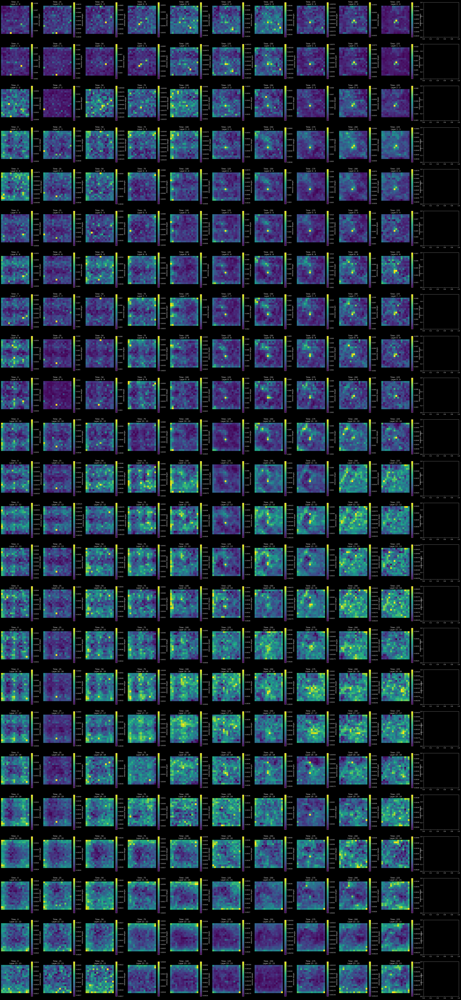

In [24]:
from PIL import Image
import os
import multiprocessing

# num_encoder_hidden_states = 264
num_register_token = 8
visualized_register_idx = 'mean'
visualize_encoder_hidden_states = False

# attention_map = original_attention_map


def plot_att_map():
    axes[i, time_i].imshow(att_map, cmap='viridis')
    axes[i, time_i].axis('off')
    axes[i, time_i].set_title(f"Time : {time} \n Layer {layer_num} : {name}")

    # Set color bar
    cbar = fig.colorbar(axes[i, time_i].imshow(
        att_map, cmap='viridis'), ax=axes[i, time_i])
    cbar.ax.set_ylabel('Attention Weight')


# Row에 = Time Step
# for visualized_register_idx in list(range(8)) + ['mean']:
for visualized_register_idx in ['mean']:
    # 전체 피규어 초기화
    vis_step = 1
    vis_step_col =  25
    num_rows = num_layers // vis_step
    num_cols = num_steps // vis_step_col + 1
    fig, axes = plt.subplots(
        num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

    from tqdm import tqdm
    for i, layer_num in tqdm(enumerate(range(0, num_layers, vis_step))):  # column
        for time_i, time in enumerate(range(0, num_steps, vis_step_col)):  # row

            # Layer Index, Attention Map 기준 (1D)
            idx = time * num_layers + layer_num

            # print(idx)
            name, layer_weight = cum_layer_weight_list[idx]
            # print(layer_weight.shape)

            if visualized_register_idx == 'mean':
                register_token_attn_map = layer_weight[-8:, :].mean(
                    axis=0)  # (4360)
            else:
                # (4360)
                register_token_attn_map = layer_weight[-8 + visualized_register_idx, :]

            max_h = 16
            max_w = 16

            # print(register_token_attn_map.shape)

            if visualize_encoder_hidden_states:
                # encoder_hidden_states_h = (num_encoder_hidden_states - num_register_token) // max_w
                att_map = np.zeros((max_h + 1, max_w))
                att_map[0, :num_register_token] = register_token_attn_map[-num_register_token:]
                att_map[1:,:] = register_token_attn_map[:-num_register_token].reshape(max_h, max_w).to(torch.float32)
            else:
                att_map = register_token_attn_map[:-num_register_token].reshape(
                    max_h, max_w).to(torch.float32)

            plot_att_map()

    plt.savefig(os.path.join(save_path,
                                f'ditl2_{scene}_registerToken{visualized_register_idx}_{"No" if not visualize_encoder_hidden_states else ""}Encoder_Rollout.png'))

## Register Token : Image vs Context (Average Time)
- Attention Rollout 기준, 해당 Layer에서 Final Layer Register Token에 얼마나 기여하는가?
- Contribution of X to Final Register Token

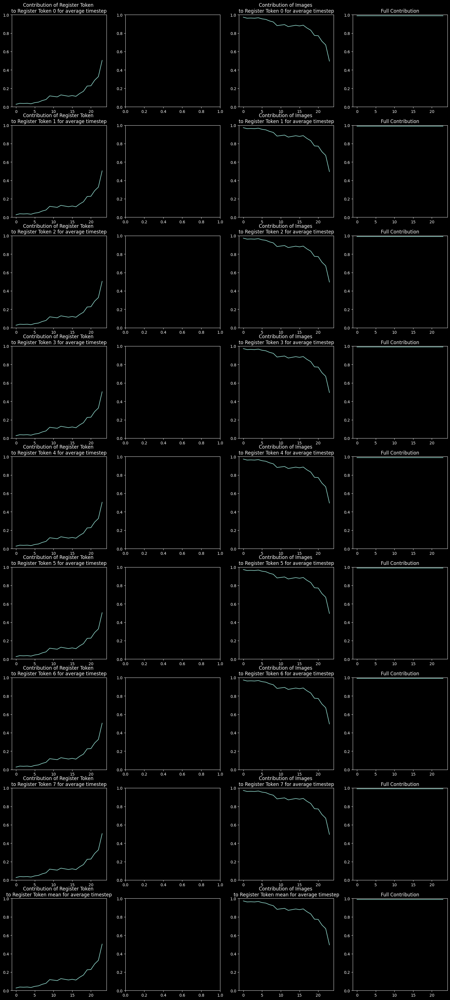

In [18]:
# 전체 피규어 초기화
vis_step = 1
num_rows = 9
num_cols = 4
fig, axes = plt.subplots(
    num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

for plot_row_idx, visualized_register_idx in enumerate(list(range(8)) + ['mean']):
    sum_register_token_attention_list = []
    sum_encoder_hidden_states_list = []
    sum_img_list = []
    for i, layer_num in enumerate(range(0, num_layers)):  # column
        sum_register_token_attention = 0
        sum_encoder_hidden_states = 0
        sum_img_attention = 0
        # 모든 Time에 대한 평균값
        for time_i, time in enumerate(range(0, num_steps, vis_step_col)):  # row
            # Layer Index, Attention Map 기준 (1D)
            idx = time * num_layers + layer_num

            name, layer_weight = cum_layer_weight_list[idx]

            # Select specific Attention Map
            if visualized_register_idx == 'mean':
                register_token_attn_map = layer_weight[-8:, :].mean(
                    axis=0)  # (4360)
            else:
                # (4360)
                register_token_attn_map = layer_weight[-8 + visualized_register_idx, :]

            register_token_attention = register_token_attn_map[-num_register_token:].sum()
            # encoder_attention = register_token_attn_map[num_register_token:num_encoder_hidden_states].sum()
            img_attention = register_token_attn_map[:-num_register_token].sum()
            # print(img_attention)

            sum_register_token_attention += register_token_attention
            # sum_encoder_hidden_states += encoder_attention
            sum_img_attention += img_attention
        
        sum_register_token_attention /= (time_i + 1)
        # sum_encoder_hidden_states /= (time_i + 1)
        sum_img_attention /= (time_i + 1)

        sum_register_token_attention_list.append(sum_register_token_attention)
        # sum_encoder_hidden_states_list.append(sum_encoder_hidden_states)
        sum_img_list.append(sum_img_attention)

    # Plot sum_encoder_hidden_states_list
    axes[plot_row_idx, 0].plot(sum_register_token_attention_list)
    axes[plot_row_idx, 0].set_ylim(0, 1)
    axes[plot_row_idx, 0].set_title(
        f"Contribution of Register Token \n to Register Token {visualized_register_idx} for average timestep ")
    
    # axes[plot_row_idx, 1].plot(sum_encoder_hidden_states_list)
    # axes[plot_row_idx, 1].set_ylim(0, 1)
    # axes[plot_row_idx, 1].set_title(
    #     f"Contribution of EncoderHiddenStates \n to Register Token {visualized_register_idx} for average timestep ")

    axes[plot_row_idx, 2].plot(sum_img_list)
    axes[plot_row_idx, 2].set_ylim(0, 1)
    axes[plot_row_idx, 2].set_title(
        f"Contribution of Images \n to Register Token {visualized_register_idx} for average timestep ")
    
    all_sum = []
    for i in range(len(sum_img_list)):
        all_sum.append(sum_register_token_attention_list[i] + sum_img_list[i] - 0.01)
        # all_sum.append(sum_register_token_attention_list[i] + sum_encoder_hidden_states_list[i] + sum_img_list[i] - 0.01)
    axes[plot_row_idx, 3].plot(all_sum)
    axes[plot_row_idx, 3].set_ylim(0, 1)
    axes[plot_row_idx, 3].set_title(
        f"Full Contribution")

plt.savefig(os.path.join(save_path, f"ditl2_{scene}_contribution_to_final_register(time_avg).png"))

## Register Token : Image vs Context (Timewise)
- Attention Rollout 기준, 해당 Layer에서 최종 Register Token에 얼마나 기여하는가?
- Contribution of X to Final Mean Register Token

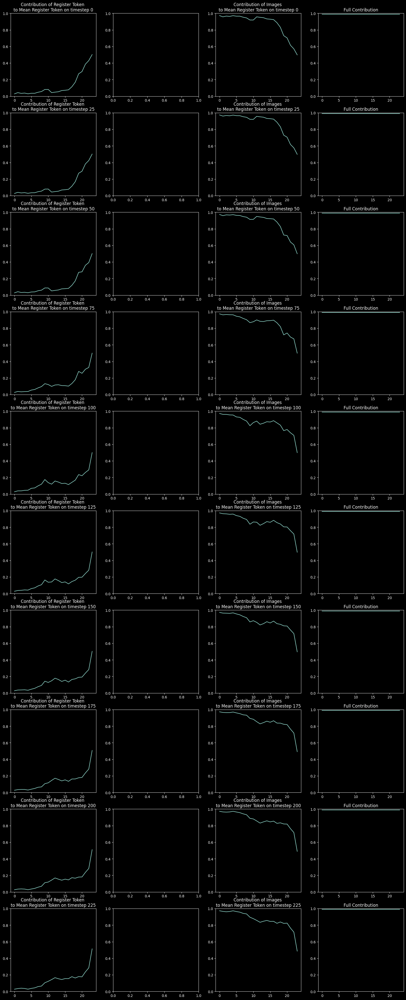

In [19]:
# 전체 피규어 초기화
vis_step = 1
vis_step_col =  25
num_rows = num_steps // vis_step_col
num_cols = 4
fig, axes = plt.subplots(
    num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

visualized_register_idx = 'mean'

for time_i, time in enumerate(range(0, num_steps, vis_step_col)):  # row
    sum_register_token_attention_list = []
    sum_encoder_hidden_states_list = []
    sum_img_list = []
    for i, layer_num in enumerate(range(0, num_layers)):  # column
        sum_register_token_attention = 0
        sum_encoder_hidden_states = 0
        sum_img_attention = 0

        # Layer Index, Attention Map 기준 (1D)
        idx = time * num_layers + layer_num
        name, layer_weight = cum_layer_weight_list[idx]

        # (4360)
        if visualized_register_idx == 'mean':
            register_token_attn_map = layer_weight[-8:, :].mean(
                axis=0)
        else:
            register_token_attn_map = layer_weight[-8 + visualized_register_idx, :]

        register_token_attention = register_token_attn_map[-num_register_token:].sum()
        # encoder_attention = register_token_attn_map[num_register_token:num_encoder_hidden_states].sum()
        img_attention = register_token_attn_map[:-num_register_token].sum()
        # print(img_attention)

        sum_register_token_attention += register_token_attention
        # sum_encoder_hidden_states += encoder_attention
        sum_img_attention += img_attention

        sum_register_token_attention_list.append(sum_register_token_attention)
        # sum_encoder_hidden_states_list.append(sum_encoder_hidden_states)
        sum_img_list.append(sum_img_attention)

    # Plot sum_encoder_hidden_states_list
    axes[time_i, 0].plot(sum_register_token_attention_list)
    axes[time_i, 0].set_ylim(0, 1)
    axes[time_i, 0].set_title(
        f"Contribution of Register Token \n to Mean Register Token on timestep {time} ")

    # axes[time_i, 1].plot(sum_encoder_hidden_states_list)
    # axes[time_i, 1].set_ylim(0, 1)
    # axes[time_i, 1].set_title(
    #     f"Contribution of EncoderHiddenStates \n to Mean Register Token on timestep {time} ")

    axes[time_i, 2].plot(sum_img_list)
    axes[time_i, 2].set_ylim(0, 1)
    axes[time_i, 2].set_title(
        f"Contribution of Images \n to Mean Register Token on timestep {time} ")

    all_sum = []
    for i in range(len(sum_img_list)):
        all_sum.append(sum_register_token_attention_list[i] + sum_img_list[i] - 0.01)
        # all_sum.append(sum_register_token_attention_list[i] + sum_encoder_hidden_states_list[i] + sum_img_list[i] - 0.01)
    axes[time_i, 3].plot(all_sum)
    axes[time_i, 3].set_ylim(0, 1)
    axes[time_i, 3].set_title(
        f"Full Contribution")

plt.savefig(os.path.join(save_path, f"ditl2_{scene}_contribution_to_final_register(timewise).png"))

## Ramdom Pixel : Image vs Context

Random Pixel Index : [ 54 158 216 147 146 225  30 216]


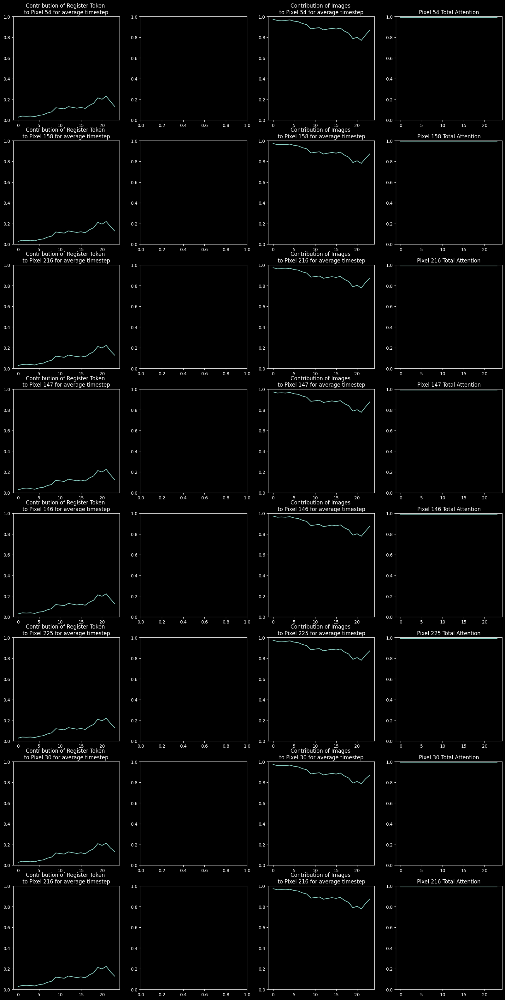

In [20]:
# 전체 피규어 초기화
vis_step = 1
num_rows = 8
num_cols = 4
fig, axes = plt.subplots(
    num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

# Select Random 8 Pixel 
list_random_pixel_idx = np.random.randint(
    0 , 256, size=8)

print(f"Random Pixel Index : {list_random_pixel_idx}")

for plot_row_idx, visualized_idx in enumerate(list_random_pixel_idx):
    sum_register_token_attention_list = []
    sum_encoder_hidden_states_list = []
    sum_img_list = []
    for i, layer_num in enumerate(range(0, num_layers)):  # column
        sum_register_token_attention = 0
        sum_encoder_hidden_states = 0
        sum_img_attention = 0
        # for time in range(num_steps):  # row
        for time_i, time in enumerate(range(0, num_steps, vis_step_col)):  # row
            # Layer Index, Attention Map 기준 (1D)
            idx = time * num_layers + layer_num

            name, layer_weight = cum_layer_weight_list[idx]

            # (256 + 8)
            register_token_attn_map = layer_weight[visualized_idx, :]

            register_token_attention = register_token_attn_map[-num_register_token:].sum()
            # encoder_attention = register_token_attn_map[num_register_token:num_encoder_hidden_states].sum()
            img_attention = register_token_attn_map[:-num_register_token].sum()
            # print(img_attention)

            sum_register_token_attention += register_token_attention
            # sum_encoder_hidden_states += encoder_attention
            sum_img_attention += img_attention
        
        sum_register_token_attention /= (time_i + 1)
        # sum_encoder_hidden_states /= num_steps
        sum_img_attention /= (time_i + 1)

        sum_register_token_attention_list.append(sum_register_token_attention)
        # sum_encoder_hidden_states_list.append(sum_encoder_hidden_states)
        sum_img_list.append(sum_img_attention)

    # Plot sum_encoder_hidden_states_list
    axes[plot_row_idx, 0].plot(sum_register_token_attention_list)
    axes[plot_row_idx, 0].set_ylim(0, 1)
    axes[plot_row_idx, 0].set_title(
        f"Contribution of Register Token \n to Pixel {visualized_idx} for average timestep ")
    
    # axes[plot_row_idx, 1].plot(sum_encoder_hidden_states_list)
    # axes[plot_row_idx, 1].set_ylim(0, 1)
    # axes[plot_row_idx, 1].set_title(
    #     f"Contribution of Encoder Hidden States \n to Pixel {visualized_idx} for average timestep ")

    axes[plot_row_idx, 2].plot(sum_img_list,)
    axes[plot_row_idx, 2].set_ylim(0, 1)
    axes[plot_row_idx, 2].set_title(
        f"Contribution of Images \n to Pixel {visualized_idx} for average timestep ")

    
    all_sum = []
    for i in range(len(sum_img_list)):
        all_sum.append(sum_register_token_attention_list[i] + sum_img_list[i] - 0.01)
        # all_sum.append(sum_register_token_attention_list[i] + sum_encoder_hidden_states_list[i] + sum_img_list[i] - 0.01)
    axes[plot_row_idx, 3].plot(all_sum)
    axes[plot_row_idx, 3].set_ylim(0, 1)
    axes[plot_row_idx, 3].set_title(
        f"Pixel {visualized_idx} Total Attention")

plt.savefig(os.path.join(save_path, f"ditl2_{scene}_contribution_to_final_pixels(time_avg).png"))


## Random Pixel Token Analysis

In [22]:
from PIL import Image
import os
import multiprocessing

# num_encoder_hidden_states = 264
num_register_token = 8
visualized_register_idx = 'mean'
visualize_encoder_hidden_states = True

# attention_map = original_attention_map

# Select Random  Pixel
random_pixel_idx = np.random.randint(
    0 , 256, size=1)

def plot_att_map():
    axes[i, time_i].imshow(att_map, cmap='viridis')
    axes[i, time_i].axis('off')
    axes[i, time_i].set_title(f"Time : {time} \n Layer {layer_num} : {name}")

    # Set color bar
    cbar = fig.colorbar(axes[i, time_i].imshow(
        att_map, cmap='viridis'), ax=axes[i, time_i])
    cbar.ax.set_ylabel('Attention Weight')


# Row에 = Time Step
# for visualized_register_idx in list(range(8)) + ['mean']:
for visualized_register_idx in ['mean']:
    # 전체 피규어 초기화
    vis_step = 1
    vis_step_col = 10
    num_rows = num_layers // vis_step
    num_cols = num_steps // vis_step_col + 1
    fig, axes = plt.subplots(
        num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

    from tqdm import tqdm
    for i, layer_num in tqdm(enumerate(range(0, num_layers, vis_step))):  # column
        for time_i, time in enumerate(range(0, num_steps, vis_step_col)):  # row

            # Layer Index, Attention Map 기준 (1D)
            idx = time * num_layers + layer_num

            # print(idx)
            name, layer_weight = cum_layer_weight_list[idx]
            # print(layer_weight.shape)

            pixel_token_attn_map = layer_weight[random_pixel_idx, :].squeeze()

            max_h = 16
            max_w = 16

            # print(pixel_token_attn_map.shape)

            if visualize_encoder_hidden_states:
                # encoder_hidden_states_h = (num_encoder_hidden_states - num_register_token) // max_w
                att_map = np.zeros((max_h + 1, max_w))
                att_map[0, :num_register_token] = pixel_token_attn_map[-num_register_token:]
                att_map[1:,:] = pixel_token_attn_map[:-num_register_token].reshape(max_h, max_w).to(torch.float32)
            else:
                att_map = pixel_token_attn_map[:-num_register_token].reshape(
                    max_h, max_w).to(torch.float32)

            plot_att_map()

    plt.savefig(os.path.join(save_path,
                                f'ditl2_{scene}_pixel{random_pixel_idx}_{"No" if not visualize_encoder_hidden_states else ""}Encoder_Rollout.png'))

24it [00:11,  2.15it/s]


In [ ]:
from PIL import Image
import os
import multiprocessing

num_register_token = 8
visualized_register_idx = 'mean'
visualize_encoder_hidden_states = False

# attention_map = original_attention_map

# Select Random 8 Pixel
random_pixel_idx = np.random.randint(
    0 + num_encoder_hidden_states, 4096 + num_encoder_hidden_states, size=1)

def plot_att_map():
    axes[i, time].imshow(att_map, cmap='viridis')
    axes[i, time].axis('off')
    axes[i, time].set_title(f"Time : {time} \n Layer {layer_num} : {name}")

    # Set color bar
    cbar = fig.colorbar(axes[i, time].imshow(
        att_map, cmap='viridis'), ax=axes[i, time])
    cbar.ax.set_ylabel('Attention Weight')


# Row에 = Time Step

# 전체 피규어 초기화
num_layers = 36
vis_step = 1
num_rows = num_layers // vis_step
num_cols = num_steps + 1
fig, axes = plt.subplots(
    num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

from tqdm import tqdm
for i, layer_num in tqdm(enumerate(range(0, num_layers, vis_step))):  # column
    for time in range(num_steps):  # row

        # Layer Index, Attention Map 기준 (1D)
        idx = time * num_layers + layer_num

        name, layer_weight = cum_layer_weight_list[idx]


        pixel_token_attn_map = layer_weight[random_pixel_idx, :].squeeze()

        max_h = 64
        max_w = 64

        if visualize_encoder_hidden_states:
            encoder_hidden_states_h = (
                num_encoder_hidden_states - num_register_token) // max_w
            att_map = np.zeros((max_h + 5, max_w))
            att_map[0, :num_register_token] = pixel_token_attn_map[:num_register_token]
            att_map[1:encoder_hidden_states_h + 1, :max_w] = pixel_token_attn_map[num_register_token:
                                                                                        num_encoder_hidden_states].reshape(encoder_hidden_states_h, max_w)
            att_map[encoder_hidden_states_h + 1:,
                    :] = pixel_token_attn_map[num_encoder_hidden_states:].reshape(max_h, max_w).to(torch.float32)
        else:
            att_map = pixel_token_attn_map[num_encoder_hidden_states:].reshape(
                max_h, max_w).to(torch.float32)

        plot_att_map()

plt.savefig(os.path.join(save_path,
                         f'ditl2_{scene}_pixel{random_pixel_idx}_{"No" if not visualize_encoder_hidden_states else ""}Encoder_Rollout.png'))
plt.close()

## Ramdom Encoder Hidden States : Image vs Context

In [ ]:
# 전체 피규어 초기화
vis_step = 1
num_rows = 8
num_cols = 4
fig, axes = plt.subplots(
    num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

# Select Random 8 Enc Hidden 
list_random_encoder_hidden_states = sorted(np.random.randint(
    num_register_token,num_encoder_hidden_states, size=8))

print(f"Random Encoder Hidden States Index : {list_random_encoder_hidden_states}")

for plot_row_idx, visualized_idx in enumerate(list_random_encoder_hidden_states):
    sum_register_token_attention_list = []
    sum_encoder_hidden_states_list = []
    sum_img_list = []
    for i, layer_num in enumerate(range(0, num_layers)):  # column
        sum_register_token_attention = 0
        sum_encoder_hidden_states = 0
        sum_img_attention = 0
        for time in range(num_steps):  # row
            # Layer Index, Attention Map 기준 (1D)
            idx = time * num_layers + layer_num

            name, layer_weight = cum_layer_weight_list[idx]

            # (4360)
            register_token_attn_map = layer_weight[visualized_idx, :]

            register_token_attention = register_token_attn_map[:num_register_token].sum()
            encoder_attention = register_token_attn_map[num_register_token:num_encoder_hidden_states].sum()
            img_attention = register_token_attn_map[num_encoder_hidden_states:].sum()
            # print(img_attention)

            sum_register_token_attention += register_token_attention
            sum_encoder_hidden_states += encoder_attention
            sum_img_attention += img_attention
        
        sum_register_token_attention /= num_steps
        sum_encoder_hidden_states /= num_steps
        sum_img_attention /= num_steps

        sum_register_token_attention_list.append(sum_register_token_attention)
        sum_encoder_hidden_states_list.append(sum_encoder_hidden_states)
        sum_img_list.append(sum_img_attention)

    # Plot sum_encoder_hidden_states_list
    axes[plot_row_idx, 0].plot(sum_register_token_attention_list)
    axes[plot_row_idx, 0].set_ylim(0, 1)
    axes[plot_row_idx, 0].set_title(
        f"Contribution of Register Token \n to Enc Hidden {visualized_idx} for average timestep ")
    
    axes[plot_row_idx, 1].plot(sum_encoder_hidden_states_list)
    axes[plot_row_idx, 1].set_ylim(0, 1)
    axes[plot_row_idx, 1].set_title(
        f"Contribution of Encoder Hidden States \n to Enc Hidden {visualized_idx} for average timestep ")

    axes[plot_row_idx, 2].plot(sum_img_list,)
    axes[plot_row_idx, 2].set_ylim(0, 1)
    axes[plot_row_idx, 2].set_title(
        f"Contribution of Images \n to Enc Hidden {visualized_idx} for average timestep ")

    
    all_sum = []
    for i in range(len(sum_img_list)):
        all_sum.append(sum_register_token_attention_list[i] + sum_encoder_hidden_states_list[i] + sum_img_list[i] - 0.01)
    axes[plot_row_idx, 3].plot(all_sum)
    axes[plot_row_idx, 3].set_ylim(0, 1)
    axes[plot_row_idx, 3].set_title(
        f"Enc Hidden {visualized_idx} Total Attention")
# plt.savefig('test.png')
plt.savefig(os.path.join(save_path, f"ditl2_{scene}_EncHiddenAttention_Rollout_AttendanceImageVsContext.png"))
print(os.path.join(save_path, f"ditl2_{scene}_EncHiddenAttention_Rollout_AttendanceImageVsContext.png"))

# Attention Rollout : 13th Layer Output의 Register Token은 무슨 정보를 담고 있는가?

In [7]:
from tqdm import tqdm
rollout_attention_map = attention_map
# for i, (name, layer_weight) in tqdm(list(enumerate(rollout_attention_map))):
#     rollout_attention_map[i] = (name, torch.Tensor(layer_weight).to(torch.float8_e4m3fn).to('cuda'))

In [ ]:
import gc
import torch
from tqdm import tqdm
cum_layer_weight_list = []
identity_matrix = torch.eye(4360)

on timestep in tqdm(range(1, 16)):
    last_layer_idx = 36 * (timestep - 1) + 13
    first_layer_idx = 36 * (timestep - 1)
    tmp_list = []
    cum_layer_weight = None
    for layer_idx in range(last_layer_idx, first_layer_idx - 1, -1):
        name, layer_weight = rollout_attention_map[layer_idx]
        modified_layer_weight = 0.5 * torch.Tensor(layer_weight) + 0.5 * identity_matrix
        if cum_layer_weight is None:
            cum_layer_weight = torch.Tensor(modified_layer_weight)
        else:
            cum_layer_weight = torch.matmul(cum_layer_weight, torch.Tensor(modified_layer_weight))
        tmp_list.append(
            (name, cum_layer_weight.detach().clone().cpu()))
    cum_layer_weight_list.extend(list(reversed(tmp_list)))

del rollout_attention_map
import gc; gc.collect()
torch.cuda.empty_cache()

In [ ]:
for i in range(num_layers):
    print(f"{i}: {cum_layer_weight_list[i][0]} | {
          cum_layer_weight_list[i][1].shape}")

## Register Token Analysis

In [ ]:
from PIL import Image
import os
import multiprocessing

num_encoder_hidden_states = 264
num_register_token = 8
visualized_register_idx = 'mean'
visualize_encoder_hidden_states = False

# attention_map = original_attention_map


def plot_att_map():
    axes[i, time].imshow(att_map, cmap='viridis')
    axes[i, time].axis('off')
    axes[i, time].set_title(f"Time : {time} \n Layer {layer_num} : {name}")

    # Set color bar
    cbar = fig.colorbar(axes[i, time].imshow(
        att_map, cmap='viridis'), ax=axes[i, time])
    cbar.ax.set_ylabel('Attention Weight')


# Row에 = Time Step
num_layers = 14
for visualized_register_idx in list(range(8)) + ['mean']:
# for visualized_register_idx in [7]:
    # 전체 피규어 초기화
    vis_step = 1
    # num_rows = num_layers // vis_step
    num_rows = num_layers // vis_step
    num_cols = num_steps
    fig, axes = plt.subplots(
        num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

    from tqdm import tqdm
    for i, layer_num in tqdm(enumerate(range(0, num_layers, vis_step))):  # column
        for time in range(num_steps):  # row

            # Layer Index, Attention Map 기준 (1D)
            idx = time * num_layers + layer_num

            name, layer_weight = cum_layer_weight_list[idx]

            if visualized_register_idx == 'mean':
                register_token_attn_map = layer_weight[0:7, :].mean(
                    axis=0)  # (4360)
            else:
                # (4360)
                register_token_attn_map = layer_weight[visualized_register_idx, :]

            max_h = 64
            max_w = 64

            if visualize_encoder_hidden_states:
                encoder_hidden_states_h = (
                    num_encoder_hidden_states - num_register_token) // max_w
                att_map = np.zeros((max_h + 5, max_w))
                att_map[0, :num_register_token] = register_token_attn_map[:num_register_token]
                att_map[1:encoder_hidden_states_h + 1, :max_w] = register_token_attn_map[num_register_token:
                                                                                            num_encoder_hidden_states].reshape(encoder_hidden_states_h, max_w)
                att_map[encoder_hidden_states_h + 1:,
                        :] = register_token_attn_map[num_encoder_hidden_states:].reshape(max_h, max_w).to(torch.float32)
            else:
                att_map = register_token_attn_map[num_encoder_hidden_states:].reshape(
                    max_h, max_w).to(torch.float32)

            plot_att_map()

    plt.savefig(os.path.join(save_path,
                                f'ditl2_{scene}_registerToken{visualized_register_idx}_{"No" if not visualize_encoder_hidden_states else ""}Encoder_Rollout_to13thLayerOutput.png'))

## Register Token : Image vs Context (Average Time)
- Attention Rollout 기준, 해당 Layer에서 최종 Register Token에 얼마나 기여하는가?

In [ ]:
# 전체 피규어 초기화
vis_step = 1
num_rows = 9
num_cols = 4
fig, axes = plt.subplots(
    num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

for plot_row_idx, visualized_register_idx in enumerate(list(range(8)) + ['mean']):
    sum_register_token_attention_list = []
    sum_encoder_hidden_states_list = []
    sum_img_list = []
    for i, layer_num in enumerate(range(0, num_layers)):  # column
        sum_register_token_attention = 0
        sum_encoder_hidden_states = 0
        sum_img_attention = 0
        # 모든 Time에 대한 평균값
        for time in range(num_steps):  # row
            # Layer Index, Attention Map 기준 (1D)
            idx = time * num_layers + layer_num

            name, layer_weight = cum_layer_weight_list[idx]

            # Select specific Attention Map
            if visualized_register_idx == 'mean':
                register_token_attn_map = layer_weight[0:7, :].mean(
                    axis=0)
            else:
                register_token_attn_map = layer_weight[visualized_register_idx, :]

            register_token_attention = register_token_attn_map[:num_register_token].sum()
            encoder_attention = register_token_attn_map[num_register_token:num_encoder_hidden_states].sum()
            img_attention = register_token_attn_map[num_encoder_hidden_states:].sum()
            # print(img_attention)

            sum_register_token_attention += register_token_attention
            sum_encoder_hidden_states += encoder_attention
            sum_img_attention += img_attention
        
        sum_register_token_attention /= num_steps
        sum_encoder_hidden_states /= num_steps
        sum_img_attention /= num_steps

        sum_register_token_attention_list.append(sum_register_token_attention)
        sum_encoder_hidden_states_list.append(sum_encoder_hidden_states)
        sum_img_list.append(sum_img_attention)

    # Plot sum_encoder_hidden_states_list
    axes[plot_row_idx, 0].plot(sum_register_token_attention_list)
    axes[plot_row_idx, 0].set_ylim(0, 1)
    axes[plot_row_idx, 0].set_title(
        f"Contribution of Register Token \n to Register Token {visualized_register_idx} for average timestep ")
    
    axes[plot_row_idx, 1].plot(sum_encoder_hidden_states_list)
    axes[plot_row_idx, 1].set_ylim(0, 1)
    axes[plot_row_idx, 1].set_title(
        f"Contribution of EncoderHiddenStates \n to Register Token {visualized_register_idx} for average timestep ")

    axes[plot_row_idx, 2].plot(sum_img_list)
    axes[plot_row_idx, 2].set_ylim(0, 1)
    axes[plot_row_idx, 2].set_title(
        f"Contribution of Images \n to Register Token {visualized_register_idx} for average timestep ")
    
    all_sum = []
    for i in range(len(sum_img_list)):
        all_sum.append(sum_register_token_attention_list[i] + sum_encoder_hidden_states_list[i] + sum_img_list[i] - 0.01)
    axes[plot_row_idx, 3].plot(all_sum)
    axes[plot_row_idx, 3].set_ylim(0, 1)
    axes[plot_row_idx, 3].set_title(
        f"Full Contribution")

plt.savefig(os.path.join(save_path, f"ditl2_{scene}_registerToken13Attention_Rollout_AttendanceImageVsContext_meanTime.png"))

## Register Token : Image vs Context (Timewise)
- Attention Rollout 기준, 해당 Layer에서 최종 Register Token에 얼마나 기여하는가?

In [ ]:
# 전체 피규어 초기화
vis_step = 1
num_rows = num_steps
num_cols = 4
fig, axes = plt.subplots(
    num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

visualized_register_idx = 'mean'

for time in range(num_steps):  # row
    sum_register_token_attention_list = []
    sum_encoder_hidden_states_list = []
    sum_img_list = []
    for i, layer_num in enumerate(range(0, num_layers)):  # column
        sum_register_token_attention = 0
        sum_encoder_hidden_states = 0
        sum_img_attention = 0

        # Layer Index, Attention Map 기준 (1D)
        idx = time * num_layers + layer_num

        name, layer_weight = cum_layer_weight_list[idx]

        # (4360)
        if visualized_register_idx == 'mean':
            register_token_attn_map = layer_weight[0:7, :].mean(
                axis=0)
        else:
            register_token_attn_map = layer_weight[visualized_register_idx, :]

        register_token_attention = register_token_attn_map[:num_register_token].sum(
        )
        encoder_attention = register_token_attn_map[num_register_token:num_encoder_hidden_states].sum(
        )
        img_attention = register_token_attn_map[num_encoder_hidden_states:].sum(
        )
        # print(img_attention)

        sum_register_token_attention += register_token_attention
        sum_encoder_hidden_states += encoder_attention
        sum_img_attention += img_attention

        sum_register_token_attention_list.append(sum_register_token_attention)
        sum_encoder_hidden_states_list.append(sum_encoder_hidden_states)
        sum_img_list.append(sum_img_attention)

    # Plot sum_encoder_hidden_states_list
    axes[time, 0].plot(sum_register_token_attention_list)
    axes[time, 0].set_ylim(0, 1)
    axes[time, 0].set_title(
        f"Contribution of Register Token \n to Mean Register Token on timestep {time} ")

    axes[time, 1].plot(sum_encoder_hidden_states_list)
    axes[time, 1].set_ylim(0, 1)
    axes[time, 1].set_title(
        f"Contribution of EncoderHiddenStates \n to Mean Register Token on timestep {time} ")

    axes[time, 2].plot(sum_img_list)
    axes[time, 2].set_ylim(0, 1)
    axes[time, 2].set_title(
        f"Contribution of Images \n to Mean Register Token on timestep {time} ")

    all_sum = []
    for i in range(len(sum_img_list)):
        all_sum.append(
            sum_register_token_attention_list[i] + sum_encoder_hidden_states_list[i] + sum_img_list[i] - 0.01)
    axes[time, 3].plot(all_sum)
    axes[time, 3].set_ylim(0, 1)
    axes[time, 3].set_title(
        f"Full Contribution")

plt.savefig(os.path.join(save_path, f"ditl2_{scene}_register13TokenAttention_Rollout_AttendanceImageVsContext.png"))